# Swish Analytics: NFL Data Scientist Take Home Assesment

### Summary (TODO):

#### Brainstorm:

##### Things I would consider to predict the odds that the next play is going to be a sack
* Historical Sacks for each player on the defense
    * Weighted by position
* Sacks allowed by the offensive linemen
* Quarterback’s number of times getting sacked
* Down and distance
    * A sack must occur on a passing play or intended passing play
    * Would expect there to be more passes on later downs, but given a certain score differential and a time of the game, passes could become more likely on earlier downs
* Field position
    * Not exactly sure, but I do believe a sack would be unlikely behind your own 15-20ydl
* Score of the game
    * Larger differential would make the team that is down more likely to pass
* Timestamp of the game


##### Models to Try:
* Purely based on historical information
    * For example, the most naive model would be to say
        * Likelihood = (number of plays resulting in a sack)/(number of total plays)
    * Then start making it more complicated a little at a time
        * Likelihood = (number of plays resulting in a sack | this team is on defense)/(number of total plays | this team is on defense)
        * You could furthermore identify it with given information about which players are currently on defense
* Train a model
    * Random forest regressor
        * Does this work when building a distribution?
        * We don’t just want to predict whether it’s a sack or not with a certain accuracy. We want to determine the odds it will happen
* Can deep learning help


## Setup Imports

In [1]:
# TODO: Gather all imports to here
from typing import Optional


import pandas as pd
import numpy as np
import matplotlib .pyplot as plt
import altair as alt

alt.data_transformers.disable_max_rows()

from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import (
    precision_recall_curve,
    confusion_matrix,
    ConfusionMatrixDisplay,
    f1_score,
    recall_score,
    accuracy_score,
    precision_score,
)

pd.set_option('display.max_columns', None)

## Exploritory Data Analysis
Let's begin by exploring and getting familiar with the various datasets which I have been provided with. Additionally for reference see the following data dictionaries
* [Dictionary](https://nflreadr.nflverse.com/articles/dictionary_pbp.html)
* [Depth Chart Dictionary](https://nflreadr.nflverse.com/articles/dictionary_depth_charts.html)
* [Snap Counts Dictionary](https://nflreadr.nflverse.com/articles/dictionary_snap_counts.html)
* [Dictionary Rosters](https://nflreadr.nflverse.com/articles/dictionary_rosters.html)

In [2]:
players_df = pd.read_csv(
    "../data/players.csv",
    header=0,
    nrows=1000
)
players_df.head()

,status,display_name,first_name,last_name,esb_id,gsis_id,birth_date,college_name,position_group,position,jersey_number,height,weight,years_of_experience,team_abbr,team_seq,current_team_id,football_name,entry_year,rookie_year,draft_club,draft_number,draftround,college_conference,status_description_abbr,status_short_description,gsis_it_id,short_name,smart_id,headshot,uniform_number,suffix
0,RET,'Omar Ellison,'Omar,Ellison,ELL711319,00-0004866,1971-10-08,NaN,WR,WR,84.0,73.0,200.0,2.0,LAC,NaN,4400.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3200454c-4c71-1319-728e-d49d3d236f8f,NaN,NaN,NaN
1,ACT,A'Shawn Robinson,A'Shawn,Robinson,ROB367960,00-0032889,1995-03-21,Alabama,DL,DE,94.0,76.0,330.0,9.0,CAR,1.0,750.0,A'Shawn,2016.0,2016.0,DET,46.0,2.0,Southeastern Conference,A01,Active,43335.0,A.Robinson,3200524f-4236-7960-bf20-bc060ac0f49c,https://static.www.nfl.com/image/upload/f_auto...,94,NaN
2,DEV,A.J. Arcuri,A.J.,Arcuri,ARC716900,00-0037845,1997-08-13,Michigan State,OL,T,61.0,79.0,320.0,2.0,LA,NaN,2510.0,A.J.,2022.0,2022.0,LA,261.0,7.0,Big Ten Conference,P01,Practice Squad,54726.0,A.Arcuri,32004152-4371-6900-5185-8cdd66b2ad11,https://static.www.nfl.com/image/upload/f_auto...,61,NaN
3,RES,A.J. Bouye,Arlandus,Bouye,BOU651714,00-0030228,1991-08-16,Central Florida,DB,CB,24.0,72.0,191.0,8.0,CAR,1.0,750.0,A.J.,2013.0,2013.0,NaN,NaN,NaN,American Athletic Conference,R01,R/Injured,40688.0,A.Bouye,3200424f-5565-1714-cb38-07c822111a12,https://static.www.nfl.com/image/private/f_aut...,24,NaN
4,ACT,A.J. Brown,Arthur,Brown,BRO413223,00-0035676,1997-06-30,Mississippi,WR,WR,11.0,72.0,226.0,6.0,PHI,1.0,3700.0,A.J.,2019.0,2019.0,TEN,51.0,2.0,Southeastern Conference,A01,Active,47834.0,A.Brown,32004252-4f41-3223-e4c5-1e30dffa87f8,https://static.www.nfl.com/image/private/f_aut...,11,NaN


In [3]:
depth_charts_2023_df = pd.read_csv(
    "../data/depth_charts_2023.csv",
    header=0,
    # nrows=1000
)
# depth_charts_2023_df[(depth_charts_2023_df["club_code"] == "SEA") & (depth_charts_2023_df["formation"] == "Defense")].sort_values(by=["week", "position", "depth_team"]).head(25)

play_by_play_2023_df = pd.read_csv(
    "../data/play_by_play_2022.csv",
    header=0,
    # nrows=10,
    low_memory=False
)
play_by_play_2023_df.sort_values(by=['week', 'play_id']).dropna(subset=["play_type"]).head()

,play_id,game_id,old_game_id,home_team,away_team,season_type,week,posteam,posteam_type,defteam,side_of_field,yardline_100,game_date,quarter_seconds_remaining,half_seconds_remaining,game_seconds_remaining,game_half,quarter_end,drive,sp,qtr,down,goal_to_go,time,yrdln,ydstogo,ydsnet,desc,play_type,yards_gained,shotgun,no_huddle,qb_dropback,qb_kneel,qb_spike,qb_scramble,pass_length,pass_location,air_yards,yards_after_catch,run_location,run_gap,field_goal_result,kick_distance,extra_point_result,two_point_conv_result,home_timeouts_remaining,away_timeouts_remaining,timeout,timeout_team,td_team,td_player_name,td_player_id,posteam_timeouts_remaining,defteam_timeouts_remaining,total_home_score,total_away_score,posteam_score,defteam_score,score_differential,posteam_score_post,defteam_score_post,score_differential_post,no_score_prob,opp_fg_prob,opp_safety_prob,opp_td_prob,fg_prob,safety_prob,td_prob,extra_point_prob,two_point_conversion_prob,ep,epa,total_home_epa,total_away_epa,total_home_rush_epa,total_away_rush_epa,total_home_pass_epa,total_away_pass_epa,air_epa,yac_epa,comp_air_epa,comp_yac_epa,total_home_comp_air_epa,total_away_comp_air_epa,total_home_comp_yac_epa,total_away_comp_yac_epa,total_home_raw_air_epa,total_away_raw_air_epa,total_home_raw_yac_epa,total_away_raw_yac_epa,wp,def_wp,home_wp,away_wp,wpa,vegas_wpa,vegas_home_wpa,home_wp_post,away_wp_post,vegas_wp,vegas_home_wp,total_home_rush_wpa,total_away_rush_wpa,total_home_pass_wpa,total_away_pass_wpa,air_wpa,yac_wpa,comp_air_wpa,comp_yac_wpa,total_home_comp_air_wpa,total_away_comp_air_wpa,total_home_comp_yac_wpa,total_away_comp_yac_wpa,total_home_raw_air_wpa,total_away_raw_air_wpa,total_home_raw_yac_wpa,total_away_raw_yac_wpa,punt_blocked,first_down_rush,first_down_pass,first_down_penalty,third_down_converted,third_down_failed,fourth_down_converted,fourth_down_failed,incomplete_pass,touchback,interception,punt_inside_twenty,punt_in_endzone,punt_out_of_bounds,punt_downed,punt_fair_catch,kickoff_inside_twenty,kickoff_in_endzone,kickoff_out_of_bounds,kickoff_downed,kickoff_fair_catch,fumble_forced,fumble_not_forced,fumble_out_of_bounds,solo_tackle,safety,penalty,tackled_for_loss,fumble_lost,own_kickoff_recovery,own_kickoff_recovery_td,qb_hit,rush_attempt,pass_attempt,sack,touchdown,pass_touchdown,rush_touchdown,return_touchdown,extra_point_attempt,two_point_attempt,field_goal_attempt,kickoff_attempt,punt_attempt,fumble,complete_pass,assist_tackle,lateral_reception,lateral_rush,lateral_return,lateral_recovery,passer_player_id,passer_player_name,passing_yards,receiver_player_id,receiver_player_name,receiving_yards,rusher_player_id,rusher_player_name,rushing_yards,lateral_receiver_player_id,lateral_receiver_player_name,lateral_receiving_yards,lateral_rusher_player_id,lateral_rusher_player_name,lateral_rushing_yards,lateral_sack_player_id,lateral_sack_player_name,interception_player_id,interception_player_name,lateral_interception_player_id,lateral_interception_player_name,punt_returner_player_id,punt_returner_player_name,lateral_punt_returner_player_id,lateral_punt_returner_player_name,kickoff_returner_player_name,kickoff_returner_player_id,lateral_kickoff_returner_player_id,lateral_kickoff_returner_player_name,punter_player_id,punter_player_name,kicker_player_name,kicker_player_id,own_kickoff_recovery_player_id,own_kickoff_recovery_player_name,blocked_player_id,blocked_player_name,tackle_for_loss_1_player_id,tackle_for_loss_1_player_name,tackle_for_loss_2_player_id,tackle_for_loss_2_player_name,qb_hit_1_player_id,qb_hit_1_player_name,qb_hit_2_player_id,qb_hit_2_player_name,forced_fumble_player_1_team,forced_fumble_player_1_player_id,forced_fumble_player_1_player_name,forced_fumble_player_2_team,forced_fumble_player_2_player_id,forced_fumble_player_2_player_name,solo_tackle_1_team,solo_tackle_2_team,solo_tackle_1_player_id,solo_tackle_2_player_id,solo_tackle_1_player_name,solo_tackle_2_player_name,assist_tackle_1_player_id,assist_tackle_1_player_name,assist_tackle_1_team,assist_tack

In [4]:
number_of_nan_play_types_per_game = play_by_play_2023_df[play_by_play_2023_df.play_type.isna()].groupby(["game_id"], as_index=False).agg({"play_id": "count"})
number_of_nan_play_types_per_game.head()

,game_id,play_id
0,2022_01_BAL_NYJ,5
1,2022_01_BUF_LA,5
2,2022_01_CLE_CAR,5
3,2022_01_DEN_SEA,5
4,2022_01_GB_MIN,5


In [5]:
play_by_play_2023_df.where(play_by_play_2023_df.game_id == "2022_10_WAS_PHI").dropna(subset=["game_id"]).head()

,play_id,game_id,old_game_id,home_team,away_team,season_type,week,posteam,posteam_type,defteam,side_of_field,yardline_100,game_date,quarter_seconds_remaining,half_seconds_remaining,game_seconds_remaining,game_half,quarter_end,drive,sp,qtr,down,goal_to_go,time,yrdln,ydstogo,ydsnet,desc,play_type,yards_gained,shotgun,no_huddle,qb_dropback,qb_kneel,qb_spike,qb_scramble,pass_length,pass_location,air_yards,yards_after_catch,run_location,run_gap,field_goal_result,kick_distance,extra_point_result,two_point_conv_result,home_timeouts_remaining,away_timeouts_remaining,timeout,timeout_team,td_team,td_player_name,td_player_id,posteam_timeouts_remaining,defteam_timeouts_remaining,total_home_score,total_away_score,posteam_score,defteam_score,score_differential,posteam_score_post,defteam_score_post,score_differential_post,no_score_prob,opp_fg_prob,opp_safety_prob,opp_td_prob,fg_prob,safety_prob,td_prob,extra_point_prob,two_point_conversion_prob,ep,epa,total_home_epa,total_away_epa,total_home_rush_epa,total_away_rush_epa,total_home_pass_epa,total_away_pass_epa,air_epa,yac_epa,comp_air_epa,comp_yac_epa,total_home_comp_air_epa,total_away_comp_air_epa,total_home_comp_yac_epa,total_away_comp_yac_epa,total_home_raw_air_epa,total_away_raw_air_epa,total_home_raw_yac_epa,total_away_raw_yac_epa,wp,def_wp,home_wp,away_wp,wpa,vegas_wpa,vegas_home_wpa,home_wp_post,away_wp_post,vegas_wp,vegas_home_wp,total_home_rush_wpa,total_away_rush_wpa,total_home_pass_wpa,total_away_pass_wpa,air_wpa,yac_wpa,comp_air_wpa,comp_yac_wpa,total_home_comp_air_wpa,total_away_comp_air_wpa,total_home_comp_yac_wpa,total_away_comp_yac_wpa,total_home_raw_air_wpa,total_away_raw_air_wpa,total_home_raw_yac_wpa,total_away_raw_yac_wpa,punt_blocked,first_down_rush,first_down_pass,first_down_penalty,third_down_converted,third_down_failed,fourth_down_converted,fourth_down_failed,incomplete_pass,touchback,interception,punt_inside_twenty,punt_in_endzone,punt_out_of_bounds,punt_downed,punt_fair_catch,kickoff_inside_twenty,kickoff_in_endzone,kickoff_out_of_bounds,kickoff_downed,kickoff_fair_catch,fumble_forced,fumble_not_forced,fumble_out_of_bounds,solo_tackle,safety,penalty,tackled_for_loss,fumble_lost,own_kickoff_recovery,own_kickoff_recovery_td,qb_hit,rush_attempt,pass_attempt,sack,touchdown,pass_touchdown,rush_touchdown,return_touchdown,extra_point_attempt,two_point_attempt,field_goal_attempt,kickoff_attempt,punt_attempt,fumble,complete_pass,assist_tackle,lateral_reception,lateral_rush,lateral_return,lateral_recovery,passer_player_id,passer_player_name,passing_yards,receiver_player_id,receiver_player_name,receiving_yards,rusher_player_id,rusher_player_name,rushing_yards,lateral_receiver_player_id,lateral_receiver_player_name,lateral_receiving_yards,lateral_rusher_player_id,lateral_rusher_player_name,lateral_rushing_yards,lateral_sack_player_id,lateral_sack_player_name,interception_player_id,interception_player_name,lateral_interception_player_id,lateral_interception_player_name,punt_returner_player_id,punt_returner_player_name,lateral_punt_returner_player_id,lateral_punt_returner_player_name,kickoff_returner_player_name,kickoff_returner_player_id,lateral_kickoff_returner_player_id,lateral_kickoff_returner_player_name,punter_player_id,punter_player_name,kicker_player_name,kicker_player_id,own_kickoff_recovery_player_id,own_kickoff_recovery_player_name,blocked_player_id,blocked_player_name,tackle_for_loss_1_player_id,tackle_for_loss_1_player_name,tackle_for_loss_2_player_id,tackle_for_loss_2_player_name,qb_hit_1_player_id,qb_hit_1_player_name,qb_hit_2_player_id,qb_hit_2_player_name,forced_fumble_player_1_team,forced_fumble_player_1_player_id,forced_fumble_player_1_player_name,forced_fumble_player_2_team,forced_fumble_player_2_player_id,forced_fumble_player_2_player_name,solo_tackle_1_team,solo_tackle_2_team,solo_tackle_1_player_id,solo_tackle_2_player_id,solo_tackle_1_player_name,solo_tackle_2_player_name,assist_tackle_1_player_id,assist_tackle_1_player_name,assist_tackle_1_team,assist_tack

In [6]:
eagles_loss_to_wash_df = play_by_play_2023_df[play_by_play_2023_df.game_id == "2022_10_WAS_PHI"]

In [7]:
for desc in eagles_loss_to_wash_df[eagles_loss_to_wash_df.drive == 1.0].desc:
    print(desc)
    print("===")

4-J.Elliott kicks 63 yards from PHI 35 to WAS 2. 24-A.Gibson to WAS 43 for 41 yards (21-A.Chachere, 17-N.Dean). PENALTY on WAS-88-A.Rogers, Offensive Holding, 8 yards, enforced at WAS 16.
===
(14:52) (Shotgun) 8-B.Robinson up the middle to WAS 11 for 3 yards (94-J.Sweat; 95-M.Tuipulotu).
===
(14:19) (Shotgun) 8-B.Robinson right guard to WAS 13 for 2 yards (95-M.Tuipulotu; 91-F.Cox).
===
(13:37) (Shotgun) 4-T.Heinicke pass incomplete deep left to 10-C.Samuel (33-J.Scott).
===
(13:32) 5-T.Way punts 47 yards to PHI 40, Center-54-C.Cheeseman. 18-B.Covey to PHI 48 for 8 yards (58-S.Toney; 39-J.Reaves). PENALTY on PHI-32-R.Blankenship, Roughing the Kicker, 15 yards, enforced at WAS 13 - No Play.
===
(13:20) (Shotgun) 4-T.Heinicke sacked at WAS 18 for -10 yards (94-J.Sweat). FUMBLES (94-J.Sweat) [94-J.Sweat], RECOVERED by PHI-95-M.Tuipulotu at WAS 18.
===


Goal is to build a training dataset which has input features with respect to the next play and predict the probability of a sack
* Features to try and collect include
    * all the down and distance and circumstancial information about the play
    * current score of the game

In [8]:
sacks_in_2022 = play_by_play_2023_df[
    (play_by_play_2023_df.play_type == "pass")
    # & (play_by_play_2023_df.sack == 1.0)
]
sacks_in_2022.head()

,play_id,game_id,old_game_id,home_team,away_team,season_type,week,posteam,posteam_type,defteam,side_of_field,yardline_100,game_date,quarter_seconds_remaining,half_seconds_remaining,game_seconds_remaining,game_half,quarter_end,drive,sp,qtr,down,goal_to_go,time,yrdln,ydstogo,ydsnet,desc,play_type,yards_gained,shotgun,no_huddle,qb_dropback,qb_kneel,qb_spike,qb_scramble,pass_length,pass_location,air_yards,yards_after_catch,run_location,run_gap,field_goal_result,kick_distance,extra_point_result,two_point_conv_result,home_timeouts_remaining,away_timeouts_remaining,timeout,timeout_team,td_team,td_player_name,td_player_id,posteam_timeouts_remaining,defteam_timeouts_remaining,total_home_score,total_away_score,posteam_score,defteam_score,score_differential,posteam_score_post,defteam_score_post,score_differential_post,no_score_prob,opp_fg_prob,opp_safety_prob,opp_td_prob,fg_prob,safety_prob,td_prob,extra_point_prob,two_point_conversion_prob,ep,epa,total_home_epa,total_away_epa,total_home_rush_epa,total_away_rush_epa,total_home_pass_epa,total_away_pass_epa,air_epa,yac_epa,comp_air_epa,comp_yac_epa,total_home_comp_air_epa,total_away_comp_air_epa,total_home_comp_yac_epa,total_away_comp_yac_epa,total_home_raw_air_epa,total_away_raw_air_epa,total_home_raw_yac_epa,total_away_raw_yac_epa,wp,def_wp,home_wp,away_wp,wpa,vegas_wpa,vegas_home_wpa,home_wp_post,away_wp_post,vegas_wp,vegas_home_wp,total_home_rush_wpa,total_away_rush_wpa,total_home_pass_wpa,total_away_pass_wpa,air_wpa,yac_wpa,comp_air_wpa,comp_yac_wpa,total_home_comp_air_wpa,total_away_comp_air_wpa,total_home_comp_yac_wpa,total_away_comp_yac_wpa,total_home_raw_air_wpa,total_away_raw_air_wpa,total_home_raw_yac_wpa,total_away_raw_yac_wpa,punt_blocked,first_down_rush,first_down_pass,first_down_penalty,third_down_converted,third_down_failed,fourth_down_converted,fourth_down_failed,incomplete_pass,touchback,interception,punt_inside_twenty,punt_in_endzone,punt_out_of_bounds,punt_downed,punt_fair_catch,kickoff_inside_twenty,kickoff_in_endzone,kickoff_out_of_bounds,kickoff_downed,kickoff_fair_catch,fumble_forced,fumble_not_forced,fumble_out_of_bounds,solo_tackle,safety,penalty,tackled_for_loss,fumble_lost,own_kickoff_recovery,own_kickoff_recovery_td,qb_hit,rush_attempt,pass_attempt,sack,touchdown,pass_touchdown,rush_touchdown,return_touchdown,extra_point_attempt,two_point_attempt,field_goal_attempt,kickoff_attempt,punt_attempt,fumble,complete_pass,assist_tackle,lateral_reception,lateral_rush,lateral_return,lateral_recovery,passer_player_id,passer_player_name,passing_yards,receiver_player_id,receiver_player_name,receiving_yards,rusher_player_id,rusher_player_name,rushing_yards,lateral_receiver_player_id,lateral_receiver_player_name,lateral_receiving_yards,lateral_rusher_player_id,lateral_rusher_player_name,lateral_rushing_yards,lateral_sack_player_id,lateral_sack_player_name,interception_player_id,interception_player_name,lateral_interception_player_id,lateral_interception_player_name,punt_returner_player_id,punt_returner_player_name,lateral_punt_returner_player_id,lateral_punt_returner_player_name,kickoff_returner_player_name,kickoff_returner_player_id,lateral_kickoff_returner_player_id,lateral_kickoff_returner_player_name,punter_player_id,punter_player_name,kicker_player_name,kicker_player_id,own_kickoff_recovery_player_id,own_kickoff_recovery_player_name,blocked_player_id,blocked_player_name,tackle_for_loss_1_player_id,tackle_for_loss_1_player_name,tackle_for_loss_2_player_id,tackle_for_loss_2_player_name,qb_hit_1_player_id,qb_hit_1_player_name,qb_hit_2_player_id,qb_hit_2_player_name,forced_fumble_player_1_team,forced_fumble_player_1_player_id,forced_fumble_player_1_player_name,forced_fumble_player_2_team,forced_fumble_player_2_player_id,forced_fumble_player_2_player_name,solo_tackle_1_team,solo_tackle_2_team,solo_tackle_1_player_id,solo_tackle_2_player_id,solo_tackle_1_player_name,solo_tackle_2_player_name,assist_tackle_1_player_id,assist_tackle_1_player_name,assist_tackle_1_team,assist_tack

In [9]:
alt.Chart(sacks_in_2022[~sacks_in_2022.down.isna()][["yardline_100", "sack", "down"]]).mark_bar().encode(
    x=alt.X("yardline_100:Q", bin=alt.Bin(maxbins=20)),
    y=alt.Y("mean(sack):Q", title="Percentage of pass plays resulting in a sack").stack(False),
    color=alt.Color("down:N", title="Down"),
    column=alt.Column("down:N", title="Down"),
    # facet=alt.Facet("defteam:N", columns=8, title="Defensive Team"),
    opacity=alt.value(0.75)
).properties(
    title=alt.Title("Percentage of pass plays resulting in a sack at a given yard line (Only 20(TBD: determine this later after cleaning up the eda section))", fontSize=25)
)

alt.Chart(...)

### TODO: Expound on the visualization

## Build Predictive Models
1. Build an initial model based on these simple circumstantial features
    1. Try logistic regression
    2. Try Naive Bayes
2. Evaluate the model
3. Expand on it with more complex input parameters about the players statistics

In [10]:
helpful_fields = ["yardline_100", "quarter_seconds_remaining", "qtr", "down", "ydstogo", "sack", "season"]
predictive_fields = ["yardline_100", "quarter_seconds_remaining", "qtr", "down", "ydstogo", "sack"]

* I'm going to move forward assuming I am given the knowledge that it is going to be a pass play. However, in the future it would be great to extend this model to try and make these predictions based on any play as it would be in reality.
* Choosing to rule out 2 point conversions for the first version of this model

In [11]:
def load_all_season_passing_plays() -> pd.DataFrame:
    """
    Load all passing plays from 2021 to 2023.

    :return: DataFrame containing all passing plays.
    """
    play_by_play_df = pd.DataFrame()

    for year in range(2021, 2024):
        cur_year_pbp_df = pd.read_csv(
            f"../data/play_by_play_{year}.csv",
            header=0,
            low_memory=False
        )
        play_by_play_df = pd.concat([play_by_play_df, cur_year_pbp_df], ignore_index=True)

    # Passing plays, non 2 point conversions
    passing_plays_df = play_by_play_df[
        (play_by_play_df.play_type == "pass")
        & (~play_by_play_df.down.isna()) # My EDA revealed that the pass plays which have null down values are 2 point conversion attmepts.
    ]
    return passing_plays_df


In [12]:
passing_plays_df = load_all_season_passing_plays()
passing_plays_df.head()

,play_id,game_id,old_game_id,home_team,away_team,season_type,week,posteam,posteam_type,defteam,side_of_field,yardline_100,game_date,quarter_seconds_remaining,half_seconds_remaining,game_seconds_remaining,game_half,quarter_end,drive,sp,qtr,down,goal_to_go,time,yrdln,ydstogo,ydsnet,desc,play_type,yards_gained,shotgun,no_huddle,qb_dropback,qb_kneel,qb_spike,qb_scramble,pass_length,pass_location,air_yards,yards_after_catch,run_location,run_gap,field_goal_result,kick_distance,extra_point_result,two_point_conv_result,home_timeouts_remaining,away_timeouts_remaining,timeout,timeout_team,td_team,td_player_name,td_player_id,posteam_timeouts_remaining,defteam_timeouts_remaining,total_home_score,total_away_score,posteam_score,defteam_score,score_differential,posteam_score_post,defteam_score_post,score_differential_post,no_score_prob,opp_fg_prob,opp_safety_prob,opp_td_prob,fg_prob,safety_prob,td_prob,extra_point_prob,two_point_conversion_prob,ep,epa,total_home_epa,total_away_epa,total_home_rush_epa,total_away_rush_epa,total_home_pass_epa,total_away_pass_epa,air_epa,yac_epa,comp_air_epa,comp_yac_epa,total_home_comp_air_epa,total_away_comp_air_epa,total_home_comp_yac_epa,total_away_comp_yac_epa,total_home_raw_air_epa,total_away_raw_air_epa,total_home_raw_yac_epa,total_away_raw_yac_epa,wp,def_wp,home_wp,away_wp,wpa,vegas_wpa,vegas_home_wpa,home_wp_post,away_wp_post,vegas_wp,vegas_home_wp,total_home_rush_wpa,total_away_rush_wpa,total_home_pass_wpa,total_away_pass_wpa,air_wpa,yac_wpa,comp_air_wpa,comp_yac_wpa,total_home_comp_air_wpa,total_away_comp_air_wpa,total_home_comp_yac_wpa,total_away_comp_yac_wpa,total_home_raw_air_wpa,total_away_raw_air_wpa,total_home_raw_yac_wpa,total_away_raw_yac_wpa,punt_blocked,first_down_rush,first_down_pass,first_down_penalty,third_down_converted,third_down_failed,fourth_down_converted,fourth_down_failed,incomplete_pass,touchback,interception,punt_inside_twenty,punt_in_endzone,punt_out_of_bounds,punt_downed,punt_fair_catch,kickoff_inside_twenty,kickoff_in_endzone,kickoff_out_of_bounds,kickoff_downed,kickoff_fair_catch,fumble_forced,fumble_not_forced,fumble_out_of_bounds,solo_tackle,safety,penalty,tackled_for_loss,fumble_lost,own_kickoff_recovery,own_kickoff_recovery_td,qb_hit,rush_attempt,pass_attempt,sack,touchdown,pass_touchdown,rush_touchdown,return_touchdown,extra_point_attempt,two_point_attempt,field_goal_attempt,kickoff_attempt,punt_attempt,fumble,complete_pass,assist_tackle,lateral_reception,lateral_rush,lateral_return,lateral_recovery,passer_player_id,passer_player_name,passing_yards,receiver_player_id,receiver_player_name,receiving_yards,rusher_player_id,rusher_player_name,rushing_yards,lateral_receiver_player_id,lateral_receiver_player_name,lateral_receiving_yards,lateral_rusher_player_id,lateral_rusher_player_name,lateral_rushing_yards,lateral_sack_player_id,lateral_sack_player_name,interception_player_id,interception_player_name,lateral_interception_player_id,lateral_interception_player_name,punt_returner_player_id,punt_returner_player_name,lateral_punt_returner_player_id,lateral_punt_returner_player_name,kickoff_returner_player_name,kickoff_returner_player_id,lateral_kickoff_returner_player_id,lateral_kickoff_returner_player_name,punter_player_id,punter_player_name,kicker_player_name,kicker_player_id,own_kickoff_recovery_player_id,own_kickoff_recovery_player_name,blocked_player_id,blocked_player_name,tackle_for_loss_1_player_id,tackle_for_loss_1_player_name,tackle_for_loss_2_player_id,tackle_for_loss_2_player_name,qb_hit_1_player_id,qb_hit_1_player_name,qb_hit_2_player_id,qb_hit_2_player_name,forced_fumble_player_1_team,forced_fumble_player_1_player_id,forced_fumble_player_1_player_name,forced_fumble_player_2_team,forced_fumble_player_2_player_id,forced_fumble_player_2_player_name,solo_tackle_1_team,solo_tackle_2_team,solo_tackle_1_player_id,solo_tackle_2_player_id,solo_tackle_1_player_name,solo_tackle_2_player_name,assist_tackle_1_player_id,assist_tackle_1_player_name,assist_tackle_1_team,assist_tack

In [13]:
alt.Chart(passing_plays_df[helpful_fields]).mark_bar().encode(
    x=alt.X("yardline_100:Q", bin=alt.Bin(maxbins=50)),
    y=alt.Y("mean(sack):Q", title="Percentage of pass plays resulting in a sack").stack(False),
    color=alt.Color("down:N", title="Down"),
    column=alt.Column("down:N", title="Down"),
    row=alt.Row("season:O", title="Quarter"),
    # facet=alt.Facet("defteam:N", columns=8, title="Defensive Team"),
    opacity=alt.value(0.75)
).properties(
    title=alt.Title("Percentage of pass plays resulting in a sack at a given yard line in a given season", fontSize=25)
)

alt.Chart(...)

In [14]:
alt.Chart(passing_plays_df[predictive_fields]).mark_bar().encode(
    x=alt.X("yardline_100:Q", bin=alt.Bin(maxbins=20)),
    y=alt.Y("mean(sack):Q", title="Percentage of pass plays resulting in a sack").stack(False),
    color=alt.Color("down:N", title="Down"),
    column=alt.Column("down:N", title="Down"),
    # facet=alt.Facet("defteam:N", columns=8, title="Defensive Team"),
    opacity=alt.value(0.75)
).properties(
    title=alt.Title("Percentage of pass plays resulting in a sack at a given yard line (2021-2023)", fontSize=25)
)

alt.Chart(...)

In [15]:
def prepare_data_for_training(
    passing_plays_df: pd.DataFrame,
    predictive_fields: list[str],
    fields_to_encode: list[str],
    do_standard_scale: bool = True,
    label_field: str = "sack",
) -> pd.DataFrame:
    """
    Prepare the passing plays DataFrame for training by selecting predictive fields,
    encoding categorical fields, and optionally standard scaling the data.

    :param passing_plays_df: DataFrame containing passing plays data.
    :param predictive_fields: List of fields to use as predictors.
    :param fields_to_encode: List of fields to encode using one-hot encoding.
    :param do_standard_scale: Whether to standard scale the data.

    :return: Prepared DataFrame ready for training.
    """
    if not set(fields_to_encode).issubset(set(predictive_fields)):
        raise ValueError(
            f"Fields to encode {fields_to_encode} must be a subset of predictive fields {predictive_fields}"
        )
    
    passing_plays_subset_df = passing_plays_df[predictive_fields]
    passing_plays_subset_df = passing_plays_subset_df.astype({"down": int})  # hard coded for now, fix later
    passing_plays_subset_df = pd.get_dummies(
        passing_plays_subset_df,
        columns=fields_to_encode,
        dtype=int
    )

    if do_standard_scale:
        temp_df = passing_plays_subset_df.copy()
        temp_df = temp_df.drop(columns=[label_field])

        scaler = StandardScaler()
        scaled_data = scaler.fit_transform(temp_df)

        temp_df = pd.DataFrame(
            scaled_data,
            columns=temp_df.columns,
        )
        temp_df[label_field] = passing_plays_subset_df[label_field].values
        
        passing_plays_subset_df = temp_df.copy()

    return passing_plays_subset_df


def get_training_test_sets(
    prepared_df: pd.DataFrame,
) -> tuple[pd.DataFrame, pd.Series, pd.DataFrame, pd.Series]:
    """
    """
    x_train, x_test, y_train, y_test = train_test_split(
        prepared_df.drop(columns=["sack"]),
        prepared_df["sack"],
        test_size=0.2,
        random_state=42
    )
    return x_train, y_train, x_test, y_test


def build_model_record(
    model_id: int,
    model_name: str,
    model: object,
    x_test: pd.DataFrame,
    y_test: pd.Series,
    desc: Optional[str] = None,
    standard_scaled: bool = False
) -> dict:
    """
    Build a record of the model's performance metrics.

    :param model_name: Name of the model.
    :param model: The trained model object.
    :param x_test: Test features DataFrame.
    :param y_test: Test labels Series.
    :param desc: Optional description of the model.
    :param standard_scaled: Whether the data was standard scaled.

    :return: Dictionary containing model performance metrics.
    """
    y_predict = model.predict(x_test)
    accuracy_curr = accuracy_score(y_test, y_predict)
    precision_curr = precision_score(y_test, y_predict, zero_division=0)
    recall_curr = recall_score(y_test, y_predict, zero_division=0)
    f1_curr = f1_score(y_test, y_predict, zero_division=0)
    model_record = {
        "model_id": model_id,
        "model": model_name,
        "desc": desc,
        "accuracy": accuracy_curr,
        "precision": precision_curr,
        "recall": recall_curr,
        "f1_score": f1_curr,
        "standard_scaled": standard_scaled,
        "class_weighting": bool(model.class_weight),
    }
    return model_record


In [16]:
# passing_plays_df should already be loaded
# passing_plays_df = load_all_season_passing_plays()
prepared_df = prepare_data_for_training(
    passing_plays_df=passing_plays_df,
    predictive_fields=predictive_fields,
    fields_to_encode=["down", "qtr"],
    do_standard_scale=False,
)
prepared_df.head()

,yardline_100,quarter_seconds_remaining,ydstogo,sack,down_1,down_2,down_3,down_4,qtr_1,qtr_2,qtr_3,qtr_4,qtr_5
3,78.0,863.0,13,0.0,0,1,0,0,1,0,0,0,0
4,75.0,822.0,10,0.0,0,0,1,0,1,0,0,0,0
6,61.0,807.0,10,0.0,1,0,0,0,1,0,0,0,0
8,31.0,746.0,18,0.0,1,0,0,0,1,0,0,0,0
9,30.0,714.0,17,0.0,0,1,0,0,1,0,0,0,0


In [17]:
x_train, y_train, x_test, y_test = get_training_test_sets(prepared_df)

In [18]:
lr_model = LogisticRegression(
    penalty="l2",
    solver="lbfgs",
    max_iter=1000,
    random_state=42,
)
lr_model.fit(x_train, y_train)

LogisticRegression(max_iter=1000, random_state=42)

In [19]:
model_performance_df = pd.DataFrame({
    "model_id": pd.Series(dtype="int"),
    "model": pd.Series(dtype="object"),
    "desc": pd.Series(dtype="object"),
    "accuracy": pd.Series(dtype="float"),
    "precision": pd.Series(dtype="float"),
    "recall": pd.Series(dtype="float"),
    "f1_score": pd.Series(dtype="float"),
    "standard_scaled": pd.Series(dtype="bool"),
    "class_weighting": pd.Series(dtype="bool"),
})

In [20]:
def record_model_results(
    model_performance_df: pd.DataFrame,
    model_name: str,
    model: object,
    x_test: pd.DataFrame,
    y_test: pd.Series,
    desc: Optional[str] = None,
    standard_scaled: bool = False
) -> pd.DataFrame:
    """
    Record the results of a model's performance and update the model performance DataFrame.

    :param model_performance_df: DataFrame to store model performance records.
    :param model_name: Name of the model.
    :param model: The trained model object.
    :param x_test: Test features DataFrame.
    :param y_test: Test labels Series.
    :param desc: Optional description of the model.
    :param standard_scaled: Whether the data was standard scaled.
    
    :return: Updated model performance DataFrame with the new model record.
    """
    model_id = len(model_performance_df)
    model_record = build_model_record(
        model_id=model_id,
        model_name=model_name,
        model=model,
        x_test=x_test,
        y_test=y_test,
        desc=desc,
        standard_scaled=standard_scaled
    )
    new_rows = [model_record]
    new_df = pd.DataFrame(new_rows)
    model_performance_df = pd.concat([model_performance_df, new_df], ignore_index=True)
    return model_performance_df


In [21]:
model_performance_df = record_model_results(
    model_performance_df=model_performance_df,
    model_name="Base Logistic Regression",
    model=lr_model,
    x_test=x_test,
    y_test=y_test,
    desc=f"Logistic Regression model trained on {', '.join(lr_model.feature_names_in_)} features with no standard scaling.",
    standard_scaled=False
)
model_performance_df

,model_id,model,desc,accuracy,precision,recall,f1_score,standard_scaled,class_weighting
0,0,Base Logistic Regression,Logistic Regression model trained on yardline_...,0.936939,0.0,0.0,0.0,False,False


In [22]:
prepared_scaled_df = prepare_data_for_training(
    passing_plays_df=passing_plays_df,
    predictive_fields=predictive_fields,
    fields_to_encode=["down", "qtr"],
    do_standard_scale=True,
)
x_train, y_train, x_test, y_test = get_training_test_sets(prepared_scaled_df)
lr_model_2 = LogisticRegression(
    penalty="l2",
    solver="lbfgs",
    max_iter=1000,
    random_state=42,
)
lr_model_2.fit(x_train, y_train)

LogisticRegression(max_iter=1000, random_state=42)

In [23]:
model_performance_df = record_model_results(
    model_performance_df=model_performance_df,
    model_name="Base Logistic Regression",
    model=lr_model_2,
    x_test=x_test,
    y_test=y_test,
    desc=f"Logistic Regression model trained on {', '.join(lr_model.feature_names_in_)} features with a standard scaler applied.",
    standard_scaled=True
)
model_performance_df

,model_id,model,desc,accuracy,precision,recall,f1_score,standard_scaled,class_weighting
0,0,Base Logistic Regression,Logistic Regression model trained on yardline_...,0.936939,0.0,0.0,0.0,False,False
1,1,Base Logistic Regression,Logistic Regression model trained on yardline_...,0.936939,0.0,0.0,0.0,True,False


In [24]:
class_weight = y_train.mean()

lr_model_3 = LogisticRegression(
    penalty="l2",
    solver="lbfgs",
    max_iter=1000,
    random_state=42,
    class_weight={1.0: 1 - class_weight, 0.0: class_weight},
)
lr_model_3.fit(x_train, y_train)

model_performance_df = record_model_results(
    model_performance_df=model_performance_df,
    model_name="Base Logistic Regression",
    model=lr_model_3,
    x_test=x_test,
    y_test=y_test,
    desc=f"Logistic Regression model trained on {', '.join(lr_model.feature_names_in_)} features with a standard scaler applied.",
    standard_scaled=False
)
model_performance_df

,model_id,model,desc,accuracy,precision,recall,f1_score,standard_scaled,class_weighting
0,0,Base Logistic Regression,Logistic Regression model trained on yardline_...,0.936939,0.000000,0.000000,0.000000,False,False
1,1,Base Logistic Regression,Logistic Regression model trained on yardline_...,0.936939,0.000000,0.000000,0.000000,True,False
2,2,Base Logistic Regression,Logistic Regression model trained on yardline_...,0.686717,0.092227,0.448718,0.153005,False,True


In [25]:
# passing_plays_df.game_date = pd.to_datetime(passing_plays_df.game_date, format="%Y-%m-%d")
# passing_plays_df["game_date"]

In [26]:
predictive_fields = ["yardline_100", "quarter_seconds_remaining", "qtr", "down", "ydstogo", "sack"]
extended_predictive_fields = predictive_fields + ["defteam", "posteam"]

prepared_extended_df = prepare_data_for_training(
    passing_plays_df=passing_plays_df,
    predictive_fields=extended_predictive_fields,
    fields_to_encode=["down", "qtr", "defteam", "posteam"],
    do_standard_scale=False,
)
prepared_extended_df.head()

,yardline_100,quarter_seconds_remaining,ydstogo,sack,down_1,down_2,down_3,down_4,qtr_1,qtr_2,qtr_3,qtr_4,qtr_5,defteam_ARI,defteam_ATL,defteam_BAL,defteam_BUF,defteam_CAR,defteam_CHI,defteam_CIN,defteam_CLE,defteam_DAL,defteam_DEN,defteam_DET,defteam_GB,defteam_HOU,defteam_IND,defteam_JAX,defteam_KC,defteam_LA,defteam_LAC,defteam_LV,defteam_MIA,defteam_MIN,defteam_NE,defteam_NO,defteam_NYG,defteam_NYJ,defteam_PHI,defteam_PIT,defteam_SEA,defteam_SF,defteam_TB,defteam_TEN,defteam_WAS,posteam_ARI,posteam_ATL,posteam_BAL,posteam_BUF,posteam_CAR,posteam_CHI,posteam_CIN,posteam_CLE,posteam_DAL,posteam_DEN,posteam_DET,posteam_GB,posteam_HOU,posteam_IND,posteam_JAX,posteam_KC,posteam_LA,posteam_LAC,posteam_LV,posteam_MIA,posteam_MIN,posteam_NE,posteam_NO,posteam_NYG,posteam_NYJ,posteam_PHI,posteam_PIT,posteam_SEA,posteam_SF,posteam_TB,posteam_TEN,posteam_WAS
3,78.0,863.0,13,0.0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
4,75.0,822.0,10,0.0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
6,61.0,807.0,10,0.0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
8,31.0,746.0,18,0.0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
9,30.0,714.0,17,0.0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [27]:
x_train, y_train, x_test, y_test = get_training_test_sets(prepared_extended_df)
lr_model_4 = LogisticRegression(
    penalty="l2",
    solver="lbfgs",
    max_iter=1000,
    random_state=42,
)
lr_model_4.fit(x_train, y_train)

model_performance_df = record_model_results(
    model_performance_df=model_performance_df,
    model_name="Extended Logistic Regression",
    model=lr_model_4,
    x_test=x_test,
    y_test=y_test,
    desc=f"Logistic Regression model trained on {', '.join(lr_model.feature_names_in_)} features with no standard scaling.",
    standard_scaled=False
)
model_performance_df

,model_id,model,desc,accuracy,precision,recall,f1_score,standard_scaled,class_weighting
0,0,Base Logistic Regression,Logistic Regression model trained on yardline_...,0.936939,0.000000,0.000000,0.000000,False,False
1,1,Base Logistic Regression,Logistic Regression model trained on yardline_...,0.936939,0.000000,0.000000,0.000000,True,False
2,2,Base Logistic Regression,Logistic Regression model trained on yardline_...,0.686717,0.092227,0.448718,0.153005,False,True
3,3,Extended Logistic Regression,Logistic Regression model trained on yardline_...,0.936939,0.000000,0.000000,0.000000,False,False


In [28]:
lr_model_5 = LogisticRegression(
    penalty="l2",
    solver="lbfgs",
    max_iter=1000,
    random_state=42,
    class_weight={1.0: 1 - class_weight, 0.0: class_weight},
)
lr_model_5.fit(x_train, y_train)

model_performance_df = record_model_results(
    model_performance_df=model_performance_df,
    model_name="Extended Logistic Regression",
    model=lr_model_5,
    x_test=x_test,
    y_test=y_test,
    desc=f"Logistic Regression model trained on {', '.join(lr_model.feature_names_in_)} features with no standard scaling.",
    standard_scaled=False
)
model_performance_df

,model_id,model,desc,accuracy,precision,recall,f1_score,standard_scaled,class_weighting
0,0,Base Logistic Regression,Logistic Regression model trained on yardline_...,0.936939,0.000000,0.000000,0.000000,False,False
1,1,Base Logistic Regression,Logistic Regression model trained on yardline_...,0.936939,0.000000,0.000000,0.000000,True,False
2,2,Base Logistic Regression,Logistic Regression model trained on yardline_...,0.686717,0.092227,0.448718,0.153005,False,True
3,3,Extended Logistic Regression,Logistic Regression model trained on yardline_...,0.936939,0.000000,0.000000,0.000000,False,False
4,4,Extended Logistic Regression,Logistic Regression model trained on yardline_...,0.612661,0.089121,0.557692,0.153683,False,True


In [29]:
model_performance_df["class_weighting"] = pd.Series([False, False, True, False, True], dtype="bool")
model_performance_df

,model_id,model,desc,accuracy,precision,recall,f1_score,standard_scaled,class_weighting
0,0,Base Logistic Regression,Logistic Regression model trained on yardline_...,0.936939,0.000000,0.000000,0.000000,False,False
1,1,Base Logistic Regression,Logistic Regression model trained on yardline_...,0.936939,0.000000,0.000000,0.000000,True,False
2,2,Base Logistic Regression,Logistic Regression model trained on yardline_...,0.686717,0.092227,0.448718,0.153005,False,True
3,3,Extended Logistic Regression,Logistic Regression model trained on yardline_...,0.936939,0.000000,0.000000,0.000000,False,False
4,4,Extended Logistic Regression,Logistic Regression model trained on yardline_...,0.612661,0.089121,0.557692,0.153683,False,True


In [30]:
lr_model.class_weight

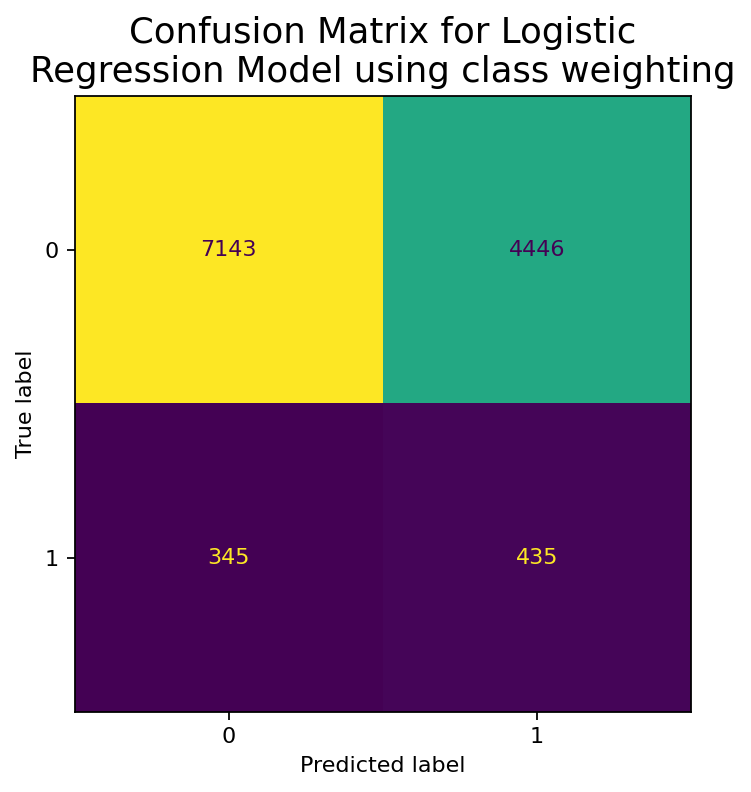

In [31]:
fig, ax = plt.subplots(figsize=(5, 5), dpi=160)

cm = confusion_matrix(y_test, lr_model_5.predict(x_test), labels=[0, 1])
ConfusionMatrixDisplay(cm).plot(colorbar=False, ax=ax)
plt.title("Confusion Matrix for Logistic\nRegression Model using class weighting", fontsize=16)
plt.show()

In [32]:
(lr_model_5.predict_proba(x_test).argmax(axis=1) == lr_model_5.predict(x_test)).all()

np.True_

The above cell reveals that logistic regression as a classifier predicts the class which belongs to the higher probability

In [33]:
TP = 435
FN = 345
FP = 4446

TP / (TP + FN), TP / (TP + FP)  # Recall and Precision respectively

(0.5576923076923077, 0.08912108174554395)

#### Describe why we want to maximize recall in our case:
- We have inbalanced classes this causes big problems in Machine Learning algorithms which typically expect to see approximately the same number of instances of each class in a classification problem.
- 

In [34]:
probas = lr_model_4.predict_proba(x_test)[:,1]
random_nums = np.random.rand(len(probas))
predictions = (probas > random_nums).astype(int)
predictions.sum()

np.int64(848)

In [35]:
probas

array([0.10554114, 0.03422494, 0.03551765, ..., 0.06310447, 0.11625848,
       0.04925789])

In [36]:
random_nums

array([0.64598226, 0.47019483, 0.96849689, ..., 0.30313752, 0.81069431,
       0.57443826])

In [37]:
predictions

array([0, 0, 0, ..., 0, 0, 0])

In [38]:
recall_score(y_test, predictions, zero_division=0), precision_score(y_test, predictions, zero_division=0)

(0.08076923076923077, 0.07429245283018868)

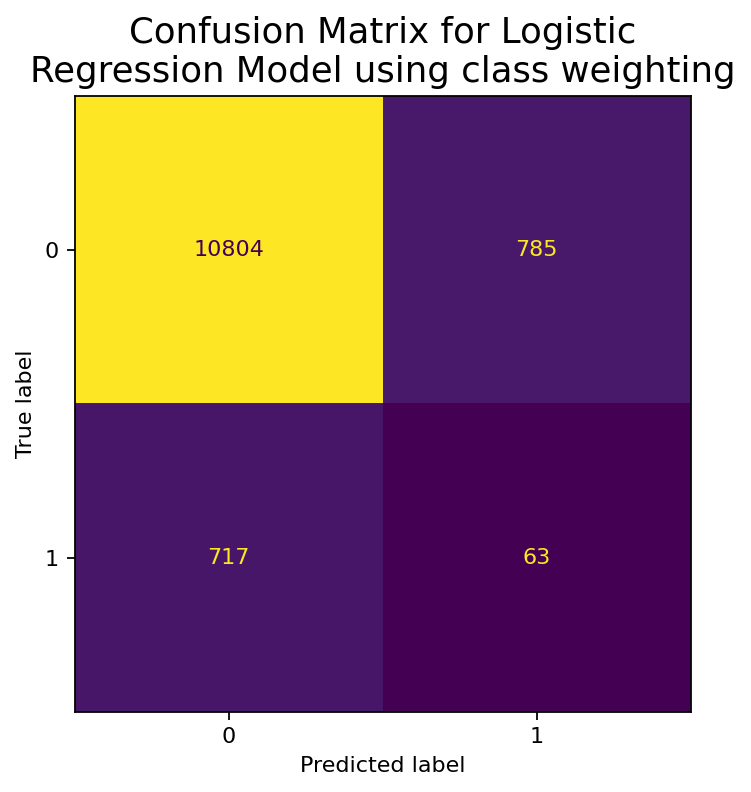

In [39]:
fig, ax = plt.subplots(figsize=(5, 5), dpi=160)

cm = confusion_matrix(y_test, predictions, labels=[0, 1])
ConfusionMatrixDisplay(cm).plot(colorbar=False, ax=ax)
plt.title("Confusion Matrix for Logistic\nRegression Model using class weighting", fontsize=16)
plt.show()

In [45]:
x_train, y_train, x_test, y_test = get_training_test_sets(prepared_scaled_df)

gauss_naive_bayes = GaussianNB()

gauss_naive_bayes.fit(x_train, y_train)

precision_score(y_test, gauss_naive_bayes.predict(x_test), labels=[0, 1], zero_division=0), recall_score(y_test, gauss_naive_bayes.predict(x_test), labels=[0, 1], zero_division=0)

(0.06965174129353234, 0.035897435897435895)

In [46]:
gauss_naive_bayes.predict_proba(x_test)

array([[0.86062719, 0.13937281],
       [0.95751163, 0.04248837],
       [0.95281638, 0.04718362],
       ...,
       [0.95118667, 0.04881333],
       [0.86885734, 0.13114266],
       [0.43756198, 0.56243802]])

In [49]:
x_train, y_train, x_test, y_test = get_training_test_sets(prepared_extended_df)

gauss_naive_bayes = GaussianNB()

gauss_naive_bayes.fit(x_train, y_train)

precision_score(y_test, gauss_naive_bayes.predict(x_test), labels=[0, 1], zero_division=0), recall_score(y_test, gauss_naive_bayes.predict(x_test), labels=[0, 1], zero_division=0)

(0.08435286542176433, 0.33589743589743587)

In [50]:
gauss_naive_bayes.predict_proba(x_test)[:10]

array([[6.82928582e-01, 3.17071418e-01],
       [9.99984666e-01, 1.53343318e-05],
       [9.99989983e-01, 1.00173150e-05],
       [1.36592896e-01, 8.63407104e-01],
       [7.40378651e-01, 2.59621349e-01],
       [9.37901105e-01, 6.20988946e-02],
       [9.99558609e-01, 4.41390889e-04],
       [2.14674773e-02, 9.78532523e-01],
       [9.99987864e-01, 1.21363084e-05],
       [5.00561611e-01, 4.99438389e-01]])

In [ ]:
lr_model_5.decision_function(x_test)

array([ 0.53337741, -0.77563037, -0.65725411, ..., -0.08239654,
        0.57091274, -0.3750084 ])

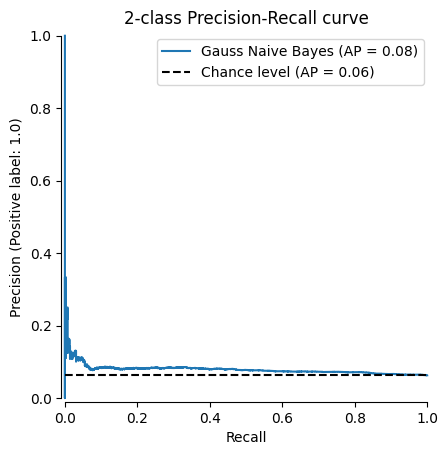

In [56]:
from sklearn.metrics import PrecisionRecallDisplay

display = PrecisionRecallDisplay.from_estimator(
    gauss_naive_bayes, x_test, y_test, name="Gauss Naive Bayes", plot_chance_level=True, despine=True
)
display.ax_.set_xlabel("Recall")
# display.ax_.set_ylabel("Precision")
_ = display.ax_.set_title("2-class Precision-Recall curve")
plt.legend(loc="upper right")
plt.show()

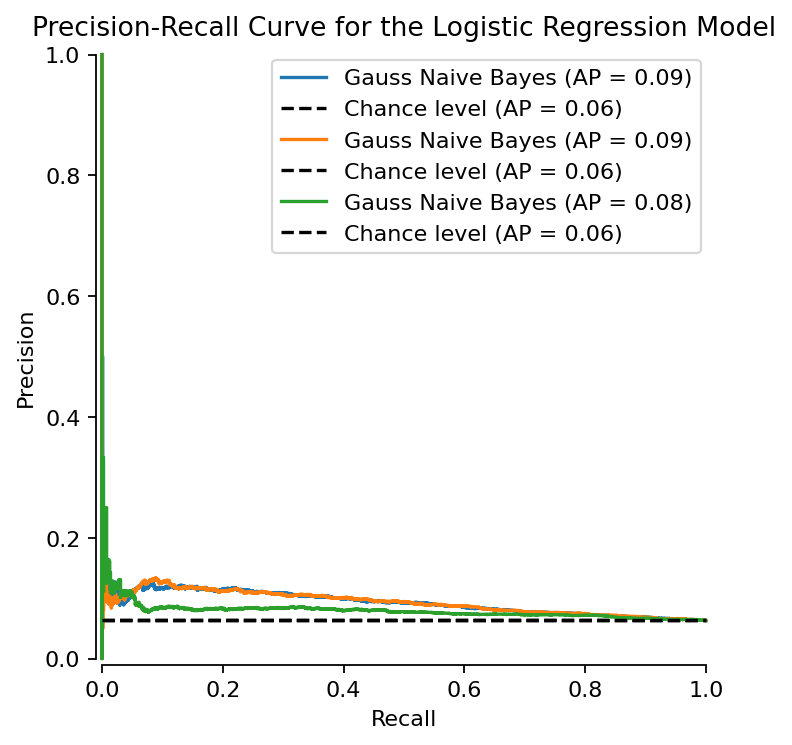

In [60]:
# precision, recall, thresholds = precision_recall_curve(y_test, lr_model.predict_proba(x_test)[:, 1], pos_label=1)
fig, ax = plt.subplots(figsize=(5, 5), dpi=160)

for model in [lr_model_4, lr_model_5, gauss_naive_bayes]:
    display = PrecisionRecallDisplay.from_estimator(
        model, x_test, y_test, name="Gauss Naive Bayes", plot_chance_level=True, despine=True, ax=ax
    )
    display.ax_.set_xlabel("Recall")
    # display.ax_.set_ylabel("Precision")
    _ = display.ax_.set_title("2-class Precision-Recall curve")
    plt.legend(loc="upper right")

plt.xlabel("Recall")
plt.ylabel("Precision")
plt.title("Precision-Recall Curve for the Logistic Regression Model")
plt.legend()
plt.show()

* advstats_week_def_{year}
* advstats_week_pass_{year}
* advstats_week_rush_{year}
* depth_charts_{year}
* play_by_play_{year}
* players
* roster_{year}
* snap_counts_{year}

In [36]:
advstats_df = pd.read_csv(
    "../data/advstats_week_pass_2021.csv",
    header=0,
    nrows=1000
)
advstats_df.head()

,game_id,pfr_game_id,season,week,game_type,team,opponent,pfr_player_name,pfr_player_id,passing_drops,passing_drop_pct,receiving_drop,receiving_drop_pct,passing_bad_throws,passing_bad_throw_pct,times_sacked,times_blitzed,times_hurried,times_hit,times_pressured,times_pressured_pct,def_times_blitzed,def_times_hurried,def_times_hitqb
0,2021_01_DAL_TB,202109090tam,2021,1,REG,TB,DAL,Tom Brady,BradTo00,3,0.064,NaN,NaN,7,0.149,0,11,1,2,3,0.060,NaN,NaN,NaN
1,2021_01_DAL_TB,202109090tam,2021,1,REG,DAL,TB,Dak Prescott,PresDa01,2,0.035,NaN,NaN,9,0.158,1,32,2,6,9,0.145,NaN,NaN,NaN
2,2021_01_PHI_ATL,202109120atl,2021,1,REG,ATL,PHI,Matt Ryan,RyanMa00,1,0.030,NaN,NaN,9,0.273,3,4,3,6,12,0.308,NaN,NaN,NaN
3,2021_01_PHI_ATL,202109120atl,2021,1,REG,PHI,ATL,Jalen Hurts,HurtJa00,0,0.000,NaN,NaN,2,0.063,1,14,4,1,6,0.154,NaN,NaN,NaN
4,2021_01_PIT_BUF,202109120buf,2021,1,REG,BUF,PIT,Josh Allen,AlleJo02,3,0.061,NaN,NaN,9,0.184,3,1,11,5,19,0.345,NaN,NaN,NaN


In [38]:
roster_df = pd.read_csv(
    "../data/roster_2021.csv",
    header=0,
    nrows=1000
)
roster_df.head()

,season,team,position,depth_chart_position,jersey_number,status,full_name,first_name,last_name,birth_date,height,weight,college,gsis_id,espn_id,sportradar_id,yahoo_id,rotowire_id,pff_id,pfr_id,fantasy_data_id,sleeper_id,years_exp,headshot_url,ngs_position,week,game_type,status_description_abbr,football_name,esb_id,gsis_it_id,smart_id,entry_year,rookie_year,draft_club,draft_number
0,2021,TB,QB,QB,12,ACT,Tom Brady,Tom,Brady,1977-08-03,76,225,Michigan,00-0019596,2330.0,41c44740-d0f6-44ab-8347-3b5d515e5ecf,5228.0,1350.0,698.0,BradTo00,4314.0,167.0,21,https://static.www.nfl.com/image/private/f_aut...,QB,20,DIV,A01,Tom,BRA371156,25511,32004252-4137-1156-7ed0-8b9e44948f13,2000,2000,NE,199.0
1,2021,NO,QB,QB,9,RET,Drew Brees,Drew,Brees,1979-01-15,72,209,Purdue,00-0020531,2580.0,bb5957e6-ce7d-47ab-8036-22191ffc1c44,5479.0,2178.0,802.0,BreeDr00,7242.0,289.0,20,https://static.www.nfl.com/image/private/f_aut...,NaN,18,REG,R02,Drew,BRE229498,26250,32004252-4522-9498-de45-55dc89e02748,2001,2001,SD,32.0
2,2021,CHI,OL,T,71,ACT,Jason Peters,Jason,Peters,1982-01-22,76,328,Arkansas,00-0022531,6012.0,46aab8e6-3ca9-4213-a6cb-87db90786f6b,7122.0,3874.0,2148.0,NaN,8920.0,412.0,17,https://static.www.nfl.com/image/private/f_aut...,T,18,REG,A01,Jason,PET150539,29550,32005045-5415-0539-96c0-31361312950f,2004,2004,NaN,NaN
3,2021,ARI,P,P,14,ACT,Andy Lee,Andy,Lee,1982-08-11,73,185,Pittsburgh,00-0022824,5713.0,edaad8e3-62cd-4715-b225-0010ee9825a0,6947.0,4044.0,1906.0,LeexAn20,3100.0,112.0,17,https://static.www.nfl.com/image/private/f_aut...,NaN,19,WC,A01,Andy,LEE008195,29141,32004c45-4500-8195-3f84-7c9db88c8928,2004,2004,SF,188.0
4,2021,PIT,QB,QB,7,ACT,Ben Roethlisberger,Ben,Roethlisberger,1982-03-02,77,240,"Miami, O.",00-0022924,5536.0,ea357add-1a41-4a8b-8f34-bbfade7f4d98,6770.0,3764.0,1732.0,RoetBe00,3807.0,138.0,17,https://static.www.nfl.com/image/private/f_aut...,QB,19,WC,A01,Ben,ROE750381,28963,3200524f-4575-0381-afea-aa103cf4a1e3,2004,2004,PIT,11.0


### Next steps
I want to incorporate the information about individual players who are likely on the field at the time. Information about how many times the quarterback had been sacked the previous year and how many total sacks the team had a previous year. We could also be more spectific about the player level sack totals and gauge the likelihood of a sack based in part on that information.

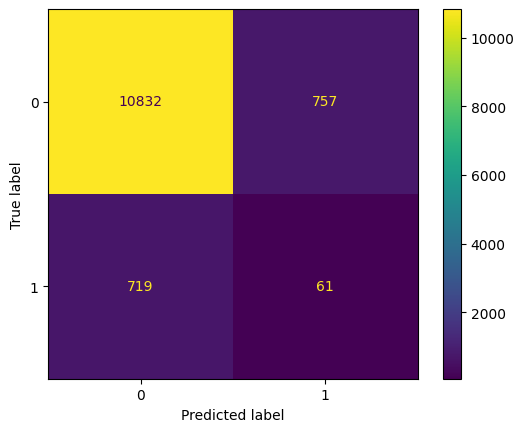

In [30]:
cm = confusion_matrix(y_test, predictions, labels=[0, 1])
ConfusionMatrixDisplay(cm).plot()

* Issue with this initial model because the model can get a very high accuracy by always predicting there is not a sack

* Basically big issue is the class imbalance.
* Consider just constructing the probability by the empirical distribution (average given the set of constraints)
    * Can I use Naive Bayes or a Decision Tree for this?

### Important ideas for next steps
* Err on the side of overestimating the probability of something happeining (results in lower payout)
* Either optimize for / compare the model performances with Precision, Recall, or F1 score. Accuracy is going to be misleading to due class imbalance